<center><h1>Jayaram_ChaitanyaPriya_HW5</h1></center>
<br>
<br>

Name: Chaitanya Priya Jayaram
<br>
Github Username: chaitanya-priya-kj
<br>
USC ID: 9525343278

# 1. Decision Trees as Interpretable Models

In [45]:
import pandas as pd
from skmultilearn.problem_transform import LabelPowerset
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import tree
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.model_selection import GridSearchCV,cross_val_score,KFold
import math
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import RepeatedKFold
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import LassoCV,Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_validate
import xgboost as xgb
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.tree import _tree

## a. Accute inflammation dataset

In [46]:
path = '../data/diagnosis_data.csv'

In [47]:
columns = ["Temperature", "Nausea", "Lumbar_Pain","Urine_pushing","Micturition_pains","Burning_of_urethra","d1:Inflammation_of_urinary_bladder","d2:Nephritis_of_renal_pelvis_origin"]

In [48]:
df = pd.read_csv(path,header = None,decimal=',',encoding='UTF_16',sep='\s+')
df.columns = columns

In [49]:
df.head()

,Temperature,Nausea,Lumbar_Pain,Urine_pushing,Micturition_pains,Burning_of_urethra,d1:Inflammation_of_urinary_bladder,d2:Nephritis_of_renal_pelvis_origin
0,35.5,no,yes,no,no,no,no,no
1,35.9,no,no,yes,yes,yes,yes,no
2,35.9,no,yes,no,no,no,no,no
3,36.0,no,no,yes,yes,yes,yes,no
4,36.0,no,yes,no,no,no,no,no


Converting categorical labels in the dataset to 1 and 0. 

In [50]:
categorical_columns = df.select_dtypes(include='object').columns
df[categorical_columns] = df[categorical_columns].replace({'yes': 1, 'no': 0})

In [51]:
df.head()

,Temperature,Nausea,Lumbar_Pain,Urine_pushing,Micturition_pains,Burning_of_urethra,d1:Inflammation_of_urinary_bladder,d2:Nephritis_of_renal_pelvis_origin
0,35.5,0,1,0,0,0,0,0
1,35.9,0,0,1,1,1,1,0
2,35.9,0,1,0,0,0,0,0
3,36.0,0,0,1,1,1,1,0
4,36.0,0,1,0,0,0,0,0


Splitting the dataframe to features and target variables 

In [52]:
X = df.iloc[:,:-2]
y = df.iloc[:,-2:]

## b. Build a decision tree on the whole data set and plot it

### Decision Tree using sklearn decision tree

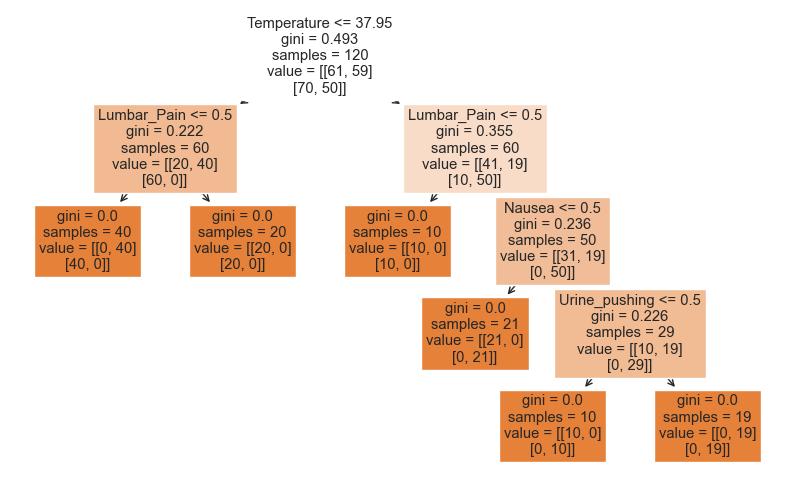

In [53]:
dt = tree.DecisionTreeClassifier() 
dt = dt.fit(X,y)
tree.plot_tree(dt,feature_names=X.columns,filled=True)
plt.rcParams["figure.figsize"]=(8,8)
plt.show()

### Decision Tree using Label Powerset

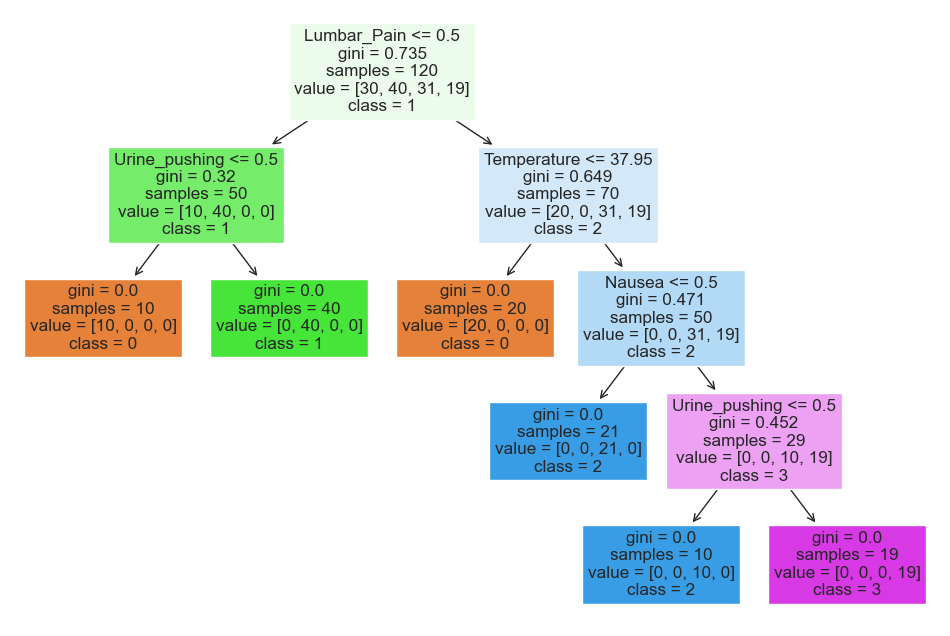

In [54]:
lp_classifier = LabelPowerset(classifier=DecisionTreeClassifier(random_state=42))
lp_classifier.fit(X.values, y)

dt_classifier = lp_classifier.classifier

feature_names = list(map(str, X.columns))
class_names = list(map(str, dt_classifier.classes_))

plt.figure(figsize=(12, 8))
tree.plot_tree(dt_classifier, feature_names=feature_names, class_names=class_names, filled=True)
plt.show()

## c. Convert the decision rules into a set of IF-THEN rules.

In [55]:
def tree_to_code(tree, feature_names):
	"""
	Outputs a decision tree model as a Python function
	
	Parameters:
	-----------
	tree: decision tree model
		The decision tree to represent as a function
	feature_names: list
		The feature names of the dataset used for building the decision tree
	"""

	tree_ = tree.tree_
	feature_name = [
		feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!"
		for i in tree_.feature
	]
	print("def tree({}):".format(", ".join(feature_names)))

	def recurse(node, depth):
		indent = "  " * depth
		if tree_.feature[node] != _tree.TREE_UNDEFINED:
			name = feature_name[node]
			threshold = tree_.threshold[node]
			print("{}if {} <= {}:".format(indent, name, threshold))
			recurse(tree_.children_left[node], depth + 1)
			print("{}else:  # if {} > {}".format(indent, name, threshold))
			recurse(tree_.children_right[node], depth + 1)
		else:
			print("{}return {}".format(indent, tree_.value[node]))

	recurse(0, 1)

### if then rules for the sklearn decision tree 

In [56]:
tree_to_code(dt, list(X.columns))

def tree(Temperature, Nausea, Lumbar_Pain, Urine_pushing, Micturition_pains, Burning_of_urethra):
  if Temperature <= 37.95000076293945:
    if Lumbar_Pain <= 0.5:
      return [[ 0. 40.]
 [40.  0.]]
    else:  # if Lumbar_Pain > 0.5
      return [[20.  0.]
 [20.  0.]]
  else:  # if Temperature > 37.95000076293945
    if Lumbar_Pain <= 0.5:
      return [[10.  0.]
 [10.  0.]]
    else:  # if Lumbar_Pain > 0.5
      if Nausea <= 0.5:
        return [[21.  0.]
 [ 0. 21.]]
      else:  # if Nausea > 0.5
        if Urine_pushing <= 0.5:
          return [[10.  0.]
 [ 0. 10.]]
        else:  # if Urine_pushing > 0.5
          return [[ 0. 19.]
 [ 0. 19.]]


### if then rules for the label powerset classifier

In [57]:
tree_to_code(dt_classifier, list(feature_names))

def tree(Temperature, Nausea, Lumbar_Pain, Urine_pushing, Micturition_pains, Burning_of_urethra):
  if Lumbar_Pain <= 0.5:
    if Urine_pushing <= 0.5:
      return [[10.  0.  0.  0.]]
    else:  # if Urine_pushing > 0.5
      return [[ 0. 40.  0.  0.]]
  else:  # if Lumbar_Pain > 0.5
    if Temperature <= 37.95000076293945:
      return [[20.  0.  0.  0.]]
    else:  # if Temperature > 37.95000076293945
      if Nausea <= 0.5:
        return [[ 0.  0. 21.  0.]]
      else:  # if Nausea > 0.5
        if Urine_pushing <= 0.5:
          return [[ 0.  0. 10.  0.]]
        else:  # if Urine_pushing > 0.5
          return [[ 0.  0.  0. 19.]]


## (d) Use cost-complexity pruning to find a minimal decision tree and a set of decision rules with high interpretability.

In [58]:
path = dt.cost_complexity_pruning_path(X,y)
ccp_alphas = path['ccp_alphas']
ccp_alphas = [f"{alpha:.15g}" for alpha in ccp_alphas]

print(ccp_alphas)

['0', '0.0490833333333333', '0.0794722222222223', '0.111111111111111', '0.204236111111111']


In [59]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

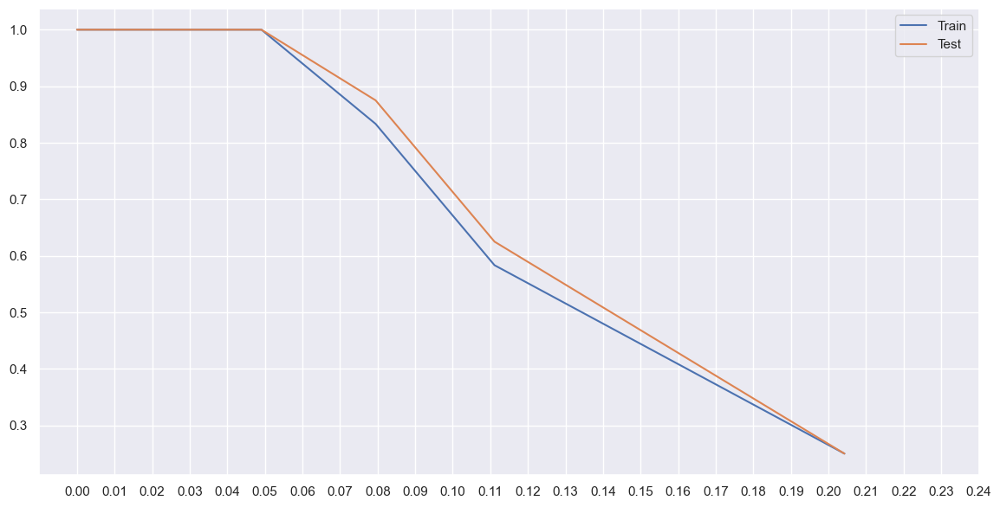

In [60]:
test_score = []
train_score = []
ccp_alphas = np.array(ccp_alphas).astype(float)
for i in ccp_alphas:
    dt_pruned = tree.DecisionTreeClassifier(ccp_alpha = i) 
    dt_pruned = dt_pruned.fit(X_train,y_train)
    y_train_pred = dt_pruned.predict(X_train)
    y_test_pred = dt_pruned.predict(X_test)
    
    train_score.append(accuracy_score(y_train,y_train_pred))
    test_score.append(accuracy_score(y_test,y_test_pred))


sns.set()
plt.figure(figsize=(14,7))
sns.lineplot(x = ccp_alphas,y = train_score,label = 'Train')
sns.lineplot(x = ccp_alphas,y = test_score,label = 'Test')
plt.xticks(ticks = np.arange(0,0.25,0.01))
plt.show()

Test accuracy is maximum when alpha = 0.0490833333333333, therefore using this alpha value for the new pruned decision tree 

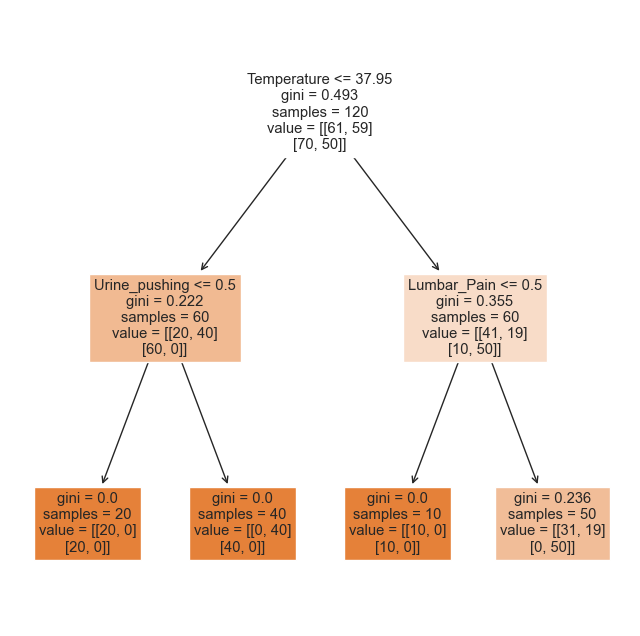

In [61]:
dt_pruned = tree.DecisionTreeClassifier(ccp_alpha=0.04908333333333333) 
dt_pruned = dt_pruned.fit(X,y)

tree.plot_tree(dt_pruned,feature_names=X.columns,filled=True)
plt.rcParams["figure.figsize"]=(10,6)
plt.show()

In [62]:
tree_to_code(dt_pruned, list(feature_names))

def tree(Temperature, Nausea, Lumbar_Pain, Urine_pushing, Micturition_pains, Burning_of_urethra):
  if Temperature <= 37.95000076293945:
    if Urine_pushing <= 0.5:
      return [[20.  0.]
 [20.  0.]]
    else:  # if Urine_pushing > 0.5
      return [[ 0. 40.]
 [40.  0.]]
  else:  # if Temperature > 37.95000076293945
    if Lumbar_Pain <= 0.5:
      return [[10.  0.]
 [10.  0.]]
    else:  # if Lumbar_Pain > 0.5
      return [[31. 19.]
 [ 0. 50.]]


# 2. The LASSO and Boosting for Regression

## (a) Download the Communities and Crime data

In [63]:
path = '../data/communities_data.csv'

In [64]:
with open('../data/communities_names.txt', 'r') as file:
    lines = file.readlines()

columns = []
for line in lines:
    if line.startswith('@attribute'):
        attribute = line.split()[1]
        columns.append(attribute)

In [65]:
df = pd.read_csv(path,header = None,na_values='?')
df.columns = columns

In [66]:
df

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,...,0.12,0.26,0.20,0.06,0.04,0.90,0.5,0.32,0.14,0.20
1,53,NaN,NaN,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,24,NaN,NaN,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,34,5.0,81440.0,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,42,95.0,6096.0,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,NaN,NaN,TempleTerracecity,10,0.01,0.40,0.10,0.87,0.12,...,0.01,0.28,0.05,NaN,NaN,NaN,NaN,0.00,NaN,0.09
1990,6,NaN,NaN,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,...,0.02,0.37,0.20,NaN,NaN,NaN,NaN,0.00,NaN,0.45
1991,9,9.0,80070.0,Waterburytown,10,0.16,0.37,0.25,0.69,0.04,...,0.08,0.32,0.18,0.08,0.06,0.78,0.0,0.91,0.28,0.23
1992,25,17.0,72600.0,Walthamcity,10,0.08,0.51,0.06,0.87,0.22,...,0.03,0.38,0.33,0.02,0.02,0.79,0.0,0.22,0.18,0.19


Splitting the dataset into training and test set

In [67]:
df_train = df.iloc[:1495,:]
df_test = df.iloc[1495:,:]

## b) Handling missing values and dropping non-predictive features 

In [68]:
df = df.drop(columns=['state', 'county','community','communityname','fold'])
df_train = df_train.drop(columns=['state', 'county','community','communityname','fold'])
df_test = df_test.drop(columns=['state', 'county','community','communityname','fold'])

In [69]:
df_train.isnull().sum()

population                0
householdsize             0
racepctblack              0
racePctWhite              0
racePctAsian              0
                       ... 
LemasPctPolicOnPatr    1256
LemasGangUnitDeploy    1256
LemasPctOfficDrugUn       0
PolicBudgPerPop        1256
ViolentCrimesPerPop       0
Length: 123, dtype: int64

In [70]:
df = df.fillna(df_train.mean(numeric_only=True))
df_train = df_train.fillna(df_train.mean(numeric_only=True))
df_test = df_test.fillna(df_test.mean(numeric_only=True))

In [71]:
df_train

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,...,0.12,0.26,0.20,0.060000,0.040000,0.900000,0.500000,0.32,0.140000,0.20
1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,...,0.02,0.12,0.45,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.67
2,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,...,0.01,0.21,0.02,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.43
3,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,...,0.02,0.39,0.28,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.12
4,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,...,0.04,0.09,0.02,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1490,0.00,0.59,0.01,0.69,1.00,0.07,0.41,0.28,0.23,0.57,...,0.02,0.14,0.22,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.03
1491,0.16,0.62,0.03,0.74,0.48,0.42,0.44,0.57,0.40,0.25,...,0.07,0.40,0.14,0.070000,0.050000,0.850000,0.500000,0.61,0.190000,0.20
1492,0.01,0.36,0.95,0.24,0.03,0.01,0.44,0.42,0.27,0.63,...,0.03,0.12,0.01,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.30
1493,0.06,0.53,0.01,0.98,0.05,0.01,0.40,0.40,0.24,0.29,...,0.08,0.15,0.02,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.03


In [72]:
X_train = df_train.iloc[:,:-1]
X_test = df_test.iloc[:,:-1]
y_train = df_train.iloc[:,-1:]
y_test = df_test.iloc[:,-1:]

## (c) Plot a correlation matrix for the features in the data set.

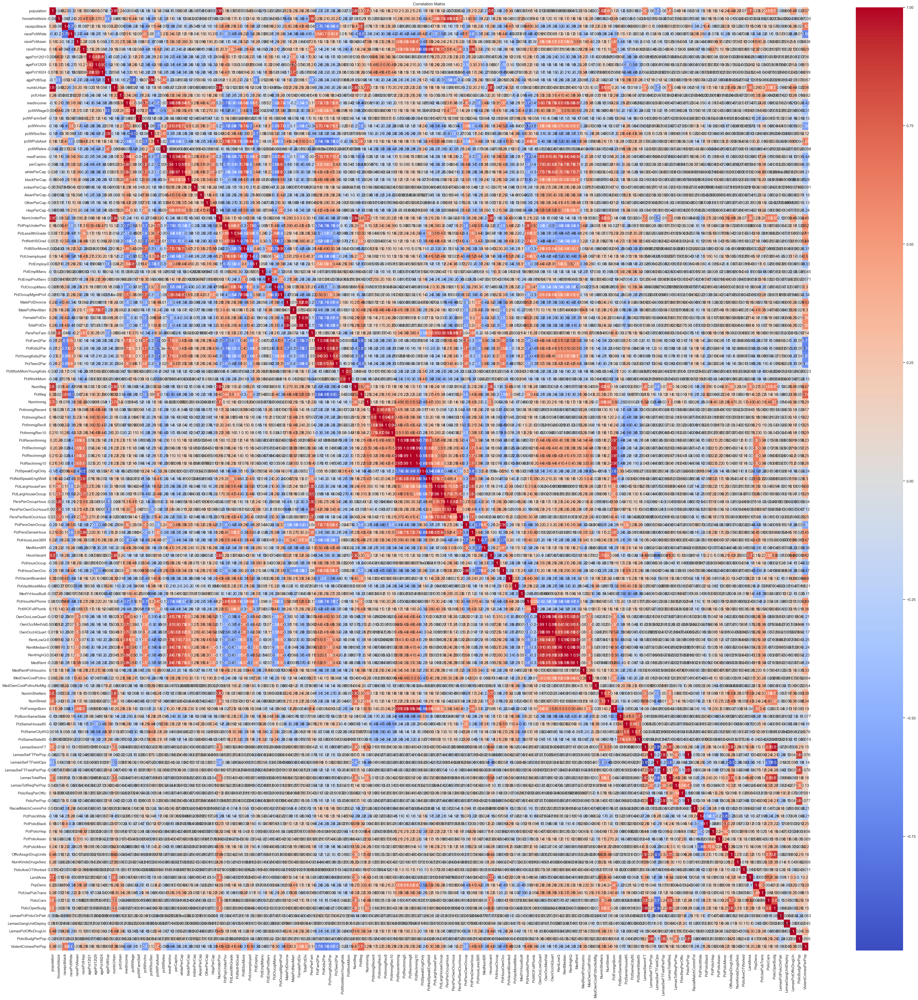

In [73]:
correlation_matrix = df.corr()

plt.figure(figsize=(50, 50))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


## (d) Calculate the Coefficient of Variation CV for each feature, where CV = s/m , in which s is sample standard deviation and m is sample mean..

In [74]:
cv_list = []
for c in df.columns:
    cv = df[c].std() / df[c].mean()
    cv_list.append(cv)
    
    
df_cv = pd.DataFrame({'col_name': df.columns, 'cv': cv_list})
df_cv

,col_name,cv
0,population,2.203503
1,householdsize,0.353298
2,racepctblack,1.410920
3,racePctWhite,0.323782
4,racePctAsian,1.359162
...,...,...
118,LemasPctPolicOnPatr,0.120471
119,LemasGangUnitDeploy,0.360299
120,LemasPctOfficDrugUn,2.555266
121,PolicBudgPerPop,0.343782


## e) Pick $b=floor(\sqrt{128})$ features with highest $CV$, and make scatter plots and box plots for them. Can you draw conclusions about significance of those features, just by the scatter plots?

In [75]:
b = math.floor(np.sqrt(128))

top_features = df_cv.nlargest(b, 'cv')
top_features[['col_name', 'cv']]
top_features

,col_name,cv
90,NumStreet,4.407702
89,NumInShelters,3.485481
49,NumIlleg,2.994196
51,NumImmig,2.900497
120,LemasPctOfficDrugUn,2.555266
27,NumUnderPov,2.304970
0,population,2.203503
10,numbUrban,2.001744
71,HousVacant,1.958780
113,LandArea,1.678031


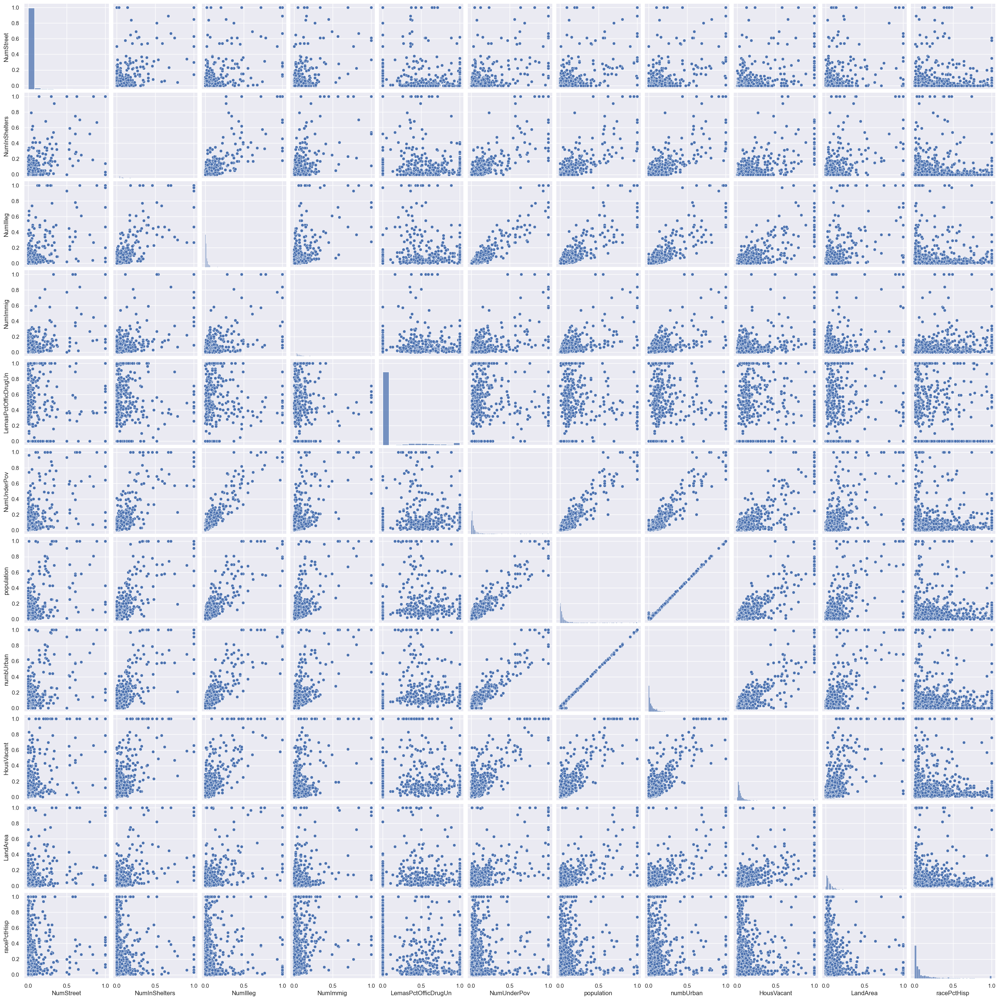

In [76]:
sns.pairplot(df[top_features.col_name])
plt.show()

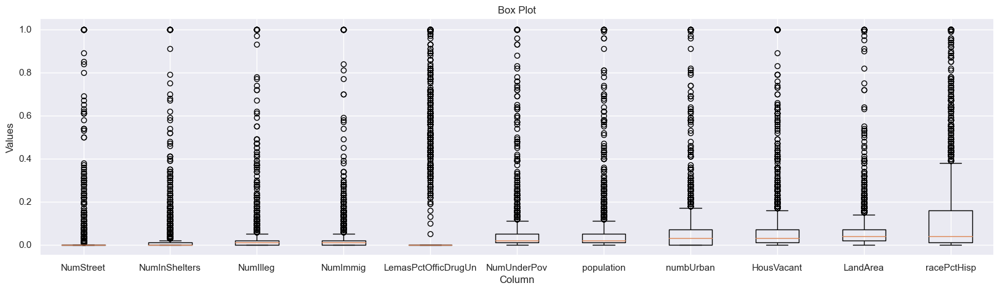

In [77]:
column_data = df[top_features.col_name]

plt.figure(figsize=(20, 5))
plt.boxplot(column_data)

plt.title('Box Plot')
plt.xlabel('Column')
plt.ylabel('Values')

plt.xticks(range(1, len(top_features.col_name) + 1), top_features.col_name)

plt.show()


Scatter plots assess the relationship between two variables. We can observe the relationship between some variables strongly but some relationships cannot be assesd using the scatter plot. 

## f) Fit a linear model using least squares to the training set and report the test error.


In [78]:
X_train = sm.add_constant(X_train)
X_test = sm.add_constant(X_test)

least_square = sm.OLS(y_train, X_train)
result = least_square.fit()

y_pred = result.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
print("Test Error (MSE):", round(mse,4))

Test Error (MSE): 0.0181


## g) Fit a ridge regression model on the training set, with λ chosen by cross-validation. Report the test error obtained.

In [79]:
model = Ridge()
cv = KFold(n_splits=10, shuffle=True, random_state=1)
grid = dict()
grid['alpha'] = [1e-3, 1e-2, 1e-1, 1]
search = GridSearchCV(model, grid, scoring='neg_mean_absolute_error', cv=cv)
results = search.fit(X_train, y_train)
print('Config: %s' % results.best_params_)


Config: {'alpha': 1}


In [80]:
best_model = Ridge(alpha=1)
best_model.fit(X_train, y_train)
y_pred = best_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print('Test Error (MSE):', round(mse,4))

Test Error (MSE): 0.0177


## h) Fit a LASSO model on the training set, with λ chosen by cross-validation. Report the test error obtained, along with a list of the variables selected by the model. Repeat with standardized features. Report the test error for both cases and compare them.

In [81]:
alphas=[1e-3, 1e-2, 1e-1, 1]
lasso_model = LassoCV(alphas=alphas, cv=5, random_state=0)
lasso_model.fit(X_train, y_train.values.ravel()) 
y_predict =lasso_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print('Test Error (MSE):', round(mse,4))
print('Best alpha: ', lasso_model.alpha_)

Test Error (MSE): 0.0177
Best alpha:  0.001


In [82]:
best_alpha = lasso_model.alpha_ 
lasso_best_model = Lasso(alpha=best_alpha)  
lasso_best_model.fit(X_train, y_train.values.ravel())  
y_pred = lasso_best_model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
print('Test Error (MSE):', round(mse, 4))

selected_variables = X_train.columns[lasso_best_model.coef_ != 0]
print("\nSelected Variables : ", selected_variables.values)

Test Error (MSE): 0.0175

Selected Variables :  ['racepctblack' 'racePctWhite' 'agePct12t29' 'pctUrban' 'pctWPubAsst'
 'AsianPerCap' 'MalePctDivorce' 'PctKids2Par' 'PctYoungKids2Par'
 'PctWorkMom' 'PctIlleg' 'PctRecImmig10' 'PctPersDenseHous' 'HousVacant'
 'PctHousOccup' 'PctVacantBoarded' 'MedRentPctHousInc'
 'MedOwnCostPctIncNoMtg' 'NumStreet' 'PctForeignBorn' 'PctSameCity85'
 'LemasGangUnitDeploy' 'LemasPctOfficDrugUn']


In [83]:
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

lasso_model_std = LassoCV(cv=5, max_iter=10000)
lasso_model_std.fit(X_train_std, y_train.values.ravel())
y_pred_std = lasso_model_std.predict(X_test_std)

test_error_std = mean_squared_error(y_test, y_pred_std)
print("Test Error (Standardized Features):", round(test_error_std,4))


Test Error (Standardized Features): 0.0178


The test error using standardised feature and the test error are almost the same. 

## i) Fit a PCR model on the training set, with M (the number of principal compo- nents) chosen by cross-validation. Report the test error obtained.


In [84]:
pca = PCA()

pipe = Pipeline(steps=[('pca', pca), ('regressor', LinearRegression())])
param_grid = {'pca__n_components': range(1, len(X_train.columns) + 1)}
search = GridSearchCV(pipe, param_grid, scoring='neg_mean_squared_error', cv=5)
search.fit(X_train, y_train)
optimal_components = search.best_params_['pca__n_components']
print("Best M: ",optimal_components)

pca = PCA(n_components=optimal_components)
X_train_pca = pca.fit_transform(X_train)
model = LinearRegression()
model.fit(X_train_pca, y_train)

X_test_pca = pca.transform(X_test)

y_pred = model.predict(X_test_pca)
test_error = mean_squared_error(y_test, y_pred)
print(f"Test Error using M = {optimal_components}: {round(test_error, 4)}")

Best M:  96
Test Error using M = 96: 0.0184


## j) In this section, we would like to fit a boosting tree to the data. As in classification trees, one can use any type of regression at each node to build a multivariate regression tree. Because the number of variables is large in this problem, one can use L1-penalized regression at each node. Such a tree is called L1 penalized gradient boosting tree. You can use XGBoost to fit the model tree. Determine α (the regularization term) using cross-validation.

In [85]:
param_grid = {'alpha': [1e-3, 1e-2, 1e-1, 1]}
xgb_model = xgb.XGBRegressor()
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5)
grid_search.fit(X_train, y_train)
xgb_model = xgb.XGBRegressor()

In [86]:
best_alpha = grid_search.best_params_['alpha']
print('Best regularization term (alpha):', best_alpha)


Best regularization term (alpha): 1


In [87]:
xgb_model_best = xgb.XGBRegressor(reg_lambda=best_alpha)
xgb_model_best.fit(X_train, y_train)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [88]:
y_pred = xgb_model_best.predict(X_test)
test_error = mean_squared_error(y_test, y_pred)
print('Test Error:', round(test_error,4))


Test Error: 0.0185


### References

https://www.analyticsvidhya.com/blog/2020/10/cost-complexity-pruning-decision-trees/<br>https://machinelearningmastery.com/ridge-regression-with-python/<br>https://www.science.smith.edu/~jcrouser/SDS293/labs/lab11-py.html<br>https://xgboost.readthedocs.io/en/latest/parameter.html#parameters-for-tree-booster